# Image Filtering Using Convolution in OpenCV

In [4]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

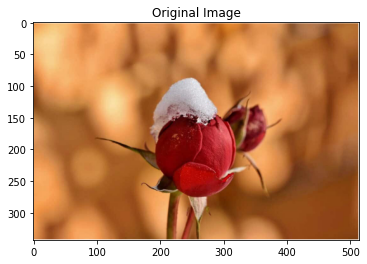

In [5]:
# Read image in
image = cv2.imread("../assets/images/example_img.png")
image = cv2.cvtColor(image,cv2.COLOR_BGR2RGB)

plt.imshow(image)
plt.title("Original Image")
plt.show()

## 1. An Introduction to Convolution Kernels in Image Processing

Trong Image Processing ta thường biết đến khái niệm tích chập với ma trận chập thường có kích thước là `1x1`, `3x3`, `5x5`, `7x7`...

Các kernels này thường dùng để thực hiện các tích chập toán học trên các pixel của ảnh nhằm đặt được các effect như blurring hay sharpening.

Lý do để blur image:

- Làm giảm thiểu nhiễu hay còn gọi là làm mượt ảnh với blurring
- Loại bỏ background

## 2. How to Use Kernels to Sharpen or Blur images

## 3. Applying Identity Kernel to an Image in OpenCV

Identity kernel là kernel có tâm là phần tử mang giá trị 1, tất cả các phần tử còn lại của ma trận mang giá trị 0 ( Như vậy khi áp dụng tích chập với ma trận kernel thì kết quả nhận được sẽ là ma trận ban đâu không đổi/ có thể thay đổi về kích thước).

![](../assets/images/identity_1.png)

Các bước để sử dụng kernel trong opencv:

* Đọc ảnh vào
* Define identity kernel, sử dụng ma trận kích thước `3x3` numpy
* Sử dụng hàm `filter2D()` để thực hiện linear filtering operation
* Visulize image
* Lưu ảnh sử dụng `imwrite()`

Hàm `filter2D` có syntax:

```python
filter2D(src, ddepth, kernel)
```

Trong đó:

- `src`: image đầu vào
- `ddepth`: là biến chỉ ra số kênh (depth) của images đầu ra hay là ta sẽ dùng bao nhiêu bộ filters (kernels), với giá trị là `-1` có nghĩa là ảnh đầu ra có `depth` bằng với `depth` của ảnh ban đầu.
- `kernel`: filter kernel 

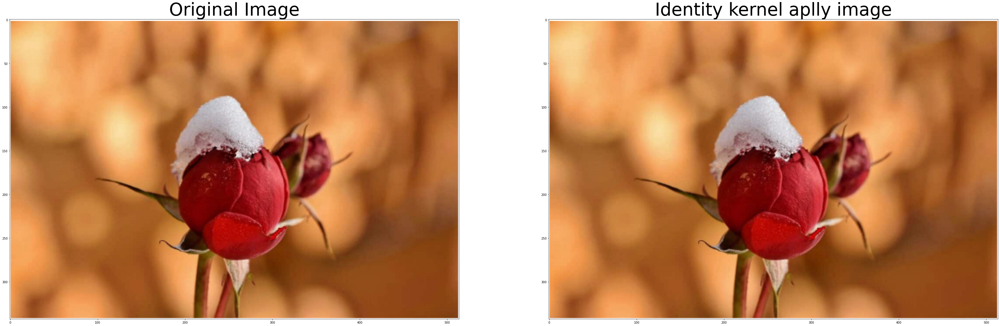

In [6]:
# Identity kernel
kernel1 = np.array([
    [0, 0, 0],
    [0, 1, 0],
    [0, 0, 0]
])

# Using filter2D()function to apply kernel to image with ddepth = -1 refers to outputs ims has same depth with original images
identity = cv2.filter2D(image, ddepth=-1,kernel= kernel1)

plt.rcParams['axes.titlesize'] = 60
plt.rcParams['figure.figsize'] = (60, 60)
plt.subplot(1,2,1)
plt.imshow(image)
plt.title("Original Image")

plt.subplot(1,2,2)
plt.imshow(identity)
plt.title("Identity kernel aplly image")

plt.show()

## 4. Bluring an Image using a Custom 2D Convolution Kernel

Sử dụng ma trận `ones` ( tất cả các phần tử là 1)

Tuy nhiên trước khi thực hiện áp phép chập thì cần phải `normalized` ma trận ( làm các phần tử của nó có giá trị trong khoảng 0 -1) bằng cách chia tất cả các phần tử cho kích thước flatten của ma trận.

Ví dụ ta sẽ dùng kernel size `5x5` => ta chia tất cả các phần tử của kernel cho 25

Text(0.5, 1.0, 'Blurring kernel aplly image')

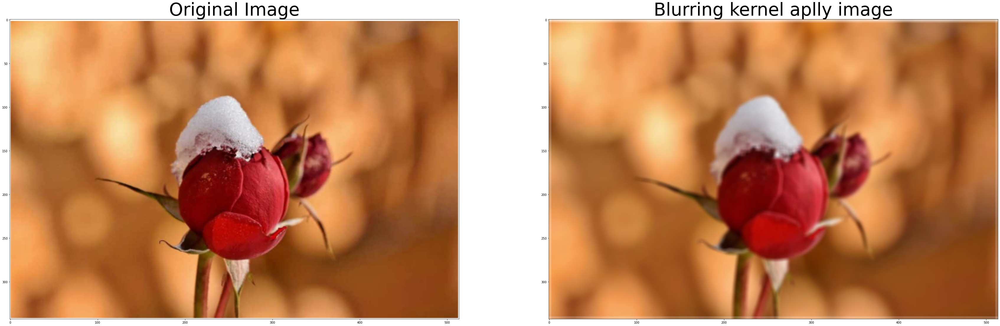

In [7]:
# Bluring kernel
kernel2 = np.ones((5, 5), np.float32) / 25
img = cv2.filter2D(src=image, ddepth=-1, kernel=kernel2)

plt.rcParams['axes.titlesize'] = 60
plt.rcParams['figure.figsize'] = (60, 60)
plt.subplot(1,2,1)
plt.imshow(image)
plt.title("Original Image")

plt.subplot(1,2,2)
plt.imshow(img)
plt.title("Blurring kernel aplly image")


## 5. Bluring an Image using OpenCV's Built-In Bluring Function

Ngoài ra để thực hiện blurring cho image thì ta có thể sử dụng hàm `blur(src, ksize)`

Text(0.5, 1.0, 'Blurring kernel aplly image')

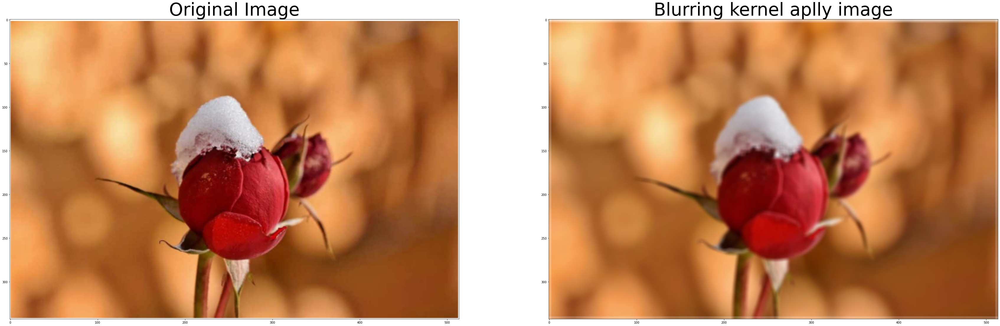

In [9]:
# Aplly blur using `blur()` function

img_blur = cv2.blur(src=image, ksize=(5, 5))

plt.rcParams['axes.titlesize'] = 60
plt.rcParams['figure.figsize'] = (60, 60)
plt.subplot(1,2,1)
plt.imshow(image)
plt.title("Original Image")

plt.subplot(1,2,2)
plt.imshow(img_blur)
plt.title("Blurring kernel aplly image")

## 6. Applying Gaussian Blurring to an Image in OpenCv

Thực hiện nhân chập ma trận ảnh đầu vào cho ma trận `gauss`. Ma trận này có các giá trị pixel được tạo nên như sau:

![](../assets/images/gauss_filter_1.png)

![](../assets/images/gauss_filter_2.png)

Sử dụng hàm `GaussianBlur()`:

```python
GaussianBlur(src, ksize, sigmaX[, dst[, sigmaY[, borderType]]])
```

Trong đó:

* `src`: là input images (dtype là Mat)
* `ksize`: là size của filter kernel
* `sigmaX`, `sigmaY`: default 2 giá trị này đều là 0


Text(0.5, 1.0, 'Gaussian kernel aplly image')

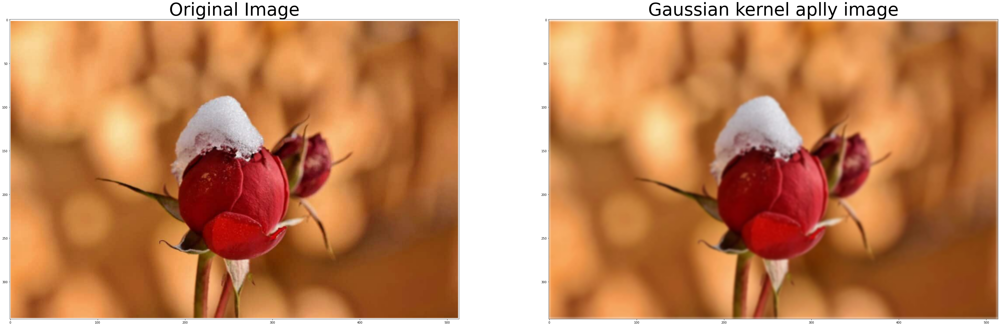

In [13]:
# Gaussian blur
gaussian_blur = cv2.GaussianBlur(image, ksize=(5, 5),
                                 sigmaX=0,
                                 sigmaY=0)
plt.rcParams['axes.titlesize'] = 60
plt.rcParams['figure.figsize'] = (60, 60)
plt.subplot(1,2,1)
plt.imshow(image)
plt.title("Original Image")

plt.subplot(1,2,2)
plt.imshow(gaussian_blur)
plt.title("Gaussian kernel aplly image")


## 7. Applying Median Blurring to an Image in OpenCv

Để sử dụng median blurring, ta sử dụng hàm `medianBlur()`. Với loại filter này, mỗi pixel của output image sẽ là kết quả của việc apply filter kernel và thay vì tính tổng thì ta lấy median (giá trị trung vị của tất cả các phần tử trong kernel áp lên).

Ví dụ cho original matrix:

| 1 | 4  | 7 | 2 | 4  |
|---|----|---|---|----|
| 3 | 4  | 5 | 1 | 41 |
| 8 | 4  | 9 | 6 | 65 |
| 8 | 76 | 8 | 3 | 4  |

Khi apply median kernel `3x3` ví dụ đối với phần ma trận:

| 1 | 4 | 7 |
|---|---|---|
| 3 | 4 | 5 |
| 8 | 4 | 9 |

Với phần ma trận trên ta dải các giá trị ra được: `1 3 4 4 4 5 7 8 9`

Như vậy phần tử trung vị (median) là phần tử nằm ở vị trí thứ 5 mang giá trị là 4. Như vậy pixel đầu tiên của ouput matrix sẽ là 4.


**Syntax:**

```python
medianBlur(src, ksize)
```

Trong đó:

- `src` là path hoặc image đầu vào
- `ksize` là kích thước filter kernel mang kiểu `int` (không phải tuple)

Text(0.5, 1.0, 'Median blurring kernel aplly image')

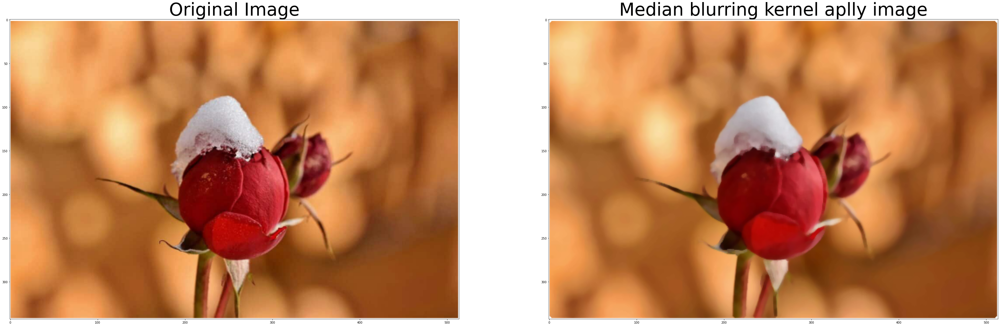

In [11]:
# Apply medianBlur
median = cv2.medianBlur(src=image, ksize=5)

plt.rcParams['axes.titlesize'] = 60
plt.rcParams['figure.figsize'] = (60, 60)
plt.subplot(1,2,1)
plt.imshow(image)
plt.title("Original Image")

plt.subplot(1,2,2)
plt.imshow(median)
plt.title("Median blurring kernel aplly image")

## 8. Sharpening an Image using Custom 2D convolution Kernel

Các ma trận [commonly used](https://en.wikipedia.org/wiki/Kernel_(image_processing)):

![](../assets/images/commonly_kernel.png)


Text(0.5, 1.0, 'Sharpening kernel aplly image')

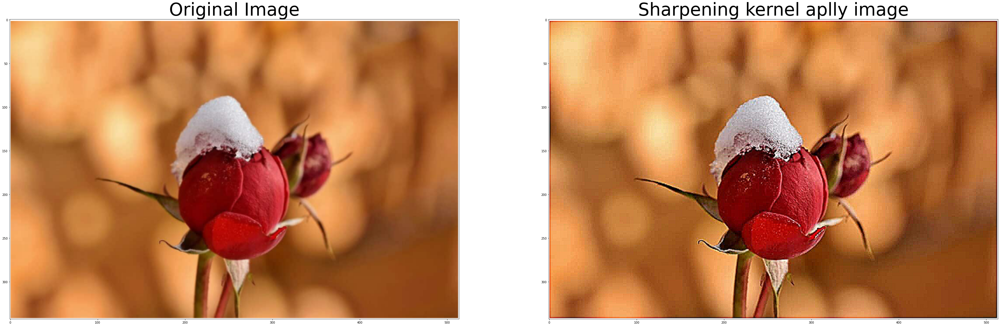

In [14]:
# Sharpen kernel
kernel3 = np.array([
    [0, -1, 0],
    [-1, 5, -1],
    [0, -1, 0]
])

sharp_img = cv2.filter2D(src=image, ddepth=-1, kernel=kernel3)

plt.rcParams['axes.titlesize'] = 60
plt.rcParams['figure.figsize'] = (60, 60)
plt.subplot(1,2,1)
plt.imshow(image)
plt.title("Original Image")

plt.subplot(1,2,2)
plt.imshow(sharp_img)
plt.title("Sharpening kernel aplly image")



## 9. Applying Bilateral Filtering to an Image in OpenCV

Với blurring thì chỉ có thể giảm nhiễu của image chứ không blur toàn bộ image như mong muốn, các chi tiết quan trọng như sharp edges sẽ bị lost. Vì vậy ta sử dụng `bilateral filtering` 

- Kỹ thuật này áp dụng bộ lọc một cách chọn lọc để làm mờ các điểm ảnh có cường độ tương tự trong vùng lân cận. Các cạnh sắc nét được giữ nguyên, ở bất cứ đâu có thể.

- Nó cho phép bạn kiểm soát không chỉ kích thước không gian của bộ lọc mà còn cả mức độ bao gồm các pixel lân cận trong đầu ra được lọc. Điều này được thực hiện, dựa trên sự thay đổi về cường độ màu của chúng và cũng như khoảng cách từ pixel được lọc.

Sử dụng hàm `bilateralFilter()`

**Syntax:**

```python
bilateralFilter(src, d, sigmaColor, sigmaSpace)
```

Trong đó:

- `src` là ảnh đầu vào
- `d` là diameter of the pixel neighborhood used for filtering
- `sigmaColor` và `sigmaSpace` define the standard deviation of the (1D) color-intensity distribution and (2D) spatial distribution respectively.
    - The sigmaSpace parameter defines the spatial extent of the kernel, in both the x and y directions (just like the Gaussian blur filter previously described).
    - The sigmaColor parameter defines the one-dimensional Gaussian distribution, which specifies the degree to which differences in pixel intensity can be tolerated.

The final (weighted) value for a pixel in the filtered image is a product of its spatial and intensity weight. Thus,

- pixels that are similar and near the filtered pixel will have influence
- pixels that are far away from the filtered pixel will have little influence (due to the spatial Gaussian)
- pixels that have dissimilar intensities will have little influence (due to the color-intensity Gaussian), even if they are close to the center of the kernel.

Text(0.5, 1.0, 'Bilateral kernel aplly image')

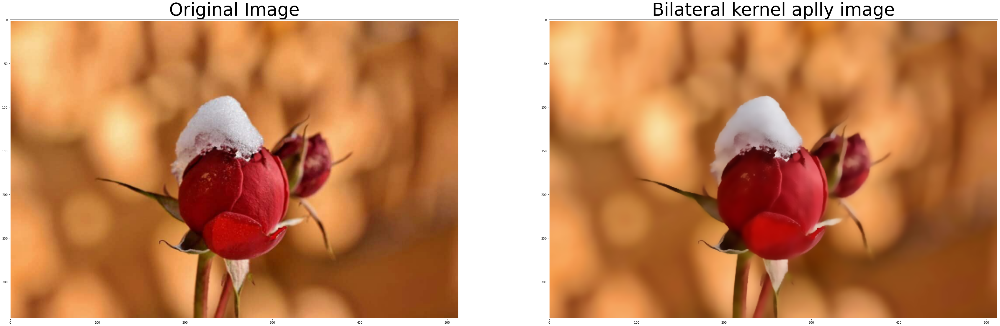

In [15]:
# Applying Bilateral Filtering
bilateral_filter = cv2.bilateralFilter(src=image, d=9, sigmaColor=75, sigmaSpace=75)

plt.rcParams['axes.titlesize'] = 60
plt.rcParams['figure.figsize'] = (60, 60)
plt.subplot(1,2,1)
plt.imshow(image)
plt.title("Original Image")

plt.subplot(1,2,2)
plt.imshow(bilateral_filter)
plt.title("Bilateral kernel aplly image")